In [163]:
import pandas as pd 
#!pip install nltk
import nltk
from nltk.corpus import stopwords 
import string
from nltk.stem import WordNetLemmatizer, SnowballStemmer,PorterStemmer
from nltk.tokenize import word_tokenize
from sklearn.feature_extraction.text import CountVectorizer
import re
import umap
import hdbscan
from sklearn.metrics.pairwise import cosine_similarity
import pyLDAvis
import itertools
import numpy as np
#nltk.download('stopwords')
#nltk.download('wordnet')
#nltk.download('omw-1.4')
from matplotlib import pyplot as plt
import gensim
from collections import Counter
import seaborn as sns


/Users/linwang/opt/anaconda3/envs/myenv/lib/python3.8/site-packages/ipykernel/ipkernel.py:287: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)
/Users/linwang/opt/anaconda3/envs/myenv/lib/python3.8/site-packages/seaborn/rcmod.py:82: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(mpl.__version__) >= "3.0":
/Users/linwang/opt/anaconda3/envs/myenv/lib/python3.8/site-packages/setuptools/_distutils/version.py:351: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  other = LooseVersion(other)


In [2]:
# load csv data
data = pd.read_csv('/Users/linwang/Intern_stuff/intern_work_summary/Project2_topic_modeling/abcnews-date-text.csv')

/Users/linwang/opt/anaconda3/envs/myenv/lib/python3.8/site-packages/ipykernel/ipkernel.py:287: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [3]:
#Sort data based on the publish date 
data.sort_values(by = ['publish_date'], axis = 0, ascending= False, inplace = True)
# data['publish_date'] = pd.to_datetime(data['publish_date'], format = '%Y%m%d')
data.head()

/Users/linwang/opt/anaconda3/envs/myenv/lib/python3.8/site-packages/ipykernel/ipkernel.py:287: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,publish_date,headline_text
1226257,20201231,womens shed canberra reskilling unemployed pan...
1226217,20201231,nsw police search for armed men in castle hill...
1226199,20201231,doughnut economics rebuild economy protect env...
1226200,20201231,farmers rejoice as december rain records fall
1226201,20201231,feral camels fattening up in south australia f...


In [4]:
#Random sampling 20,000 data for the purpose of analysis due to computational limitation 
sample_data = data.sample(n = 20000, random_state = 42)
sample_data.head()

/Users/linwang/opt/anaconda3/envs/myenv/lib/python3.8/site-packages/ipykernel/ipkernel.py:287: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,publish_date,headline_text
706949,20120708,interview daniel cross
691470,20120501,caviar back to adelaide
471201,20090626,north west qld draft growth plan revealed
394247,20080702,belinda neal available for police interview
644172,20111010,geelong man dies in phuket fall: report


In [5]:
#covert date column to pandas datetime datatype
sample_data['publish_date']=pd.to_datetime(sample_data['publish_date'],format='%Y%m%d')
sample_data.head()

/Users/linwang/opt/anaconda3/envs/myenv/lib/python3.8/site-packages/ipykernel/ipkernel.py:287: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,publish_date,headline_text
706949,2012-07-08,interview daniel cross
691470,2012-05-01,caviar back to adelaide
471201,2009-06-26,north west qld draft growth plan revealed
394247,2008-07-02,belinda neal available for police interview
644172,2011-10-10,geelong man dies in phuket fall: report


In [6]:
#Group news headline by published year, and count how many news published in each year
index_date= sample_data['publish_date'].groupby(by = sample_data['publish_date'].dt.year).count()
index_date

/Users/linwang/opt/anaconda3/envs/myenv/lib/python3.8/site-packages/ipykernel/ipkernel.py:287: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


publish_date
2003    1053
2004    1230
2005    1225
2006    1017
2007    1296
2008    1347
2009    1198
2010    1303
2011    1304
2012    1403
2013    1553
2014    1311
2015    1211
2016     979
2017     808
2018     574
2019     522
2020     666
Name: publish_date, dtype: int64

In [7]:
headline = sample_data['headline_text'].reset_index(drop = True)
headline

/Users/linwang/opt/anaconda3/envs/myenv/lib/python3.8/site-packages/ipykernel/ipkernel.py:287: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


0                                  interview daniel cross
1                                 caviar back to adelaide
2               north west qld draft growth plan revealed
3             belinda neal available for police interview
4                 geelong man dies in phuket fall: report
                               ...                       
19995                 kabul hotel siege ends with 13 dead
19996                             10yo pinned under truck
19997                barredo costa fined after tour brawl
19998    thousands of firefighters on standby as heatwave
19999              the waterfront war for asciano hots up
Name: headline_text, Length: 20000, dtype: object

In [8]:
# docs = {key: doc for key, doc in enumerate(headline_text)}
# docs

/Users/linwang/opt/anaconda3/envs/myenv/lib/python3.8/site-packages/ipykernel/ipkernel.py:287: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [9]:
#convert headline column to list for future analysis 
headline_text = headline.values.tolist()
#len(headline_text)
headline_text

/Users/linwang/opt/anaconda3/envs/myenv/lib/python3.8/site-packages/ipykernel/ipkernel.py:287: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


['interview daniel cross',
 'caviar back to adelaide',
 'north west qld draft growth plan revealed',
 'belinda neal available for police interview',
 'geelong man dies in phuket fall: report',
 'child welfare group attacks interim commissioner',
 'two detainees in hospital after slashing themselves',
 'how coronavirus helped a remote indigenous community',
 'green group fears reef inquiry wont be taken',
 'emissions graph article',
 'motorcyclist dies in sun coast crash',
 'anglicare sydney victim of cyber security breach involving data',
 'cooperative members walk but alice springs date farm continues',
 'no fat to cut in queensland rural fire services',
 'helen trifelly first art exhibition',
 'new cancer drug signals a government rethink on evidence',
 'coroner investigates whether drugs played role in garage shute',
 'central land council ranger camp wave hill',
 'deadline looms for shire name change say',
 'warehouse owners lose insurance due to bikie neighbours',
 'private resett

/Users/linwang/opt/anaconda3/envs/myenv/lib/python3.8/site-packages/ipykernel/ipkernel.py:287: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


(array([ 386.,  755., 1295., 3144., 4518., 7092., 1670.,  781.,  266.,
          93.]),
 array([ 1. ,  2.2,  3.4,  4.6,  5.8,  7. ,  8.2,  9.4, 10.6, 11.8, 13. ]),
 <BarContainer object of 10 artists>)

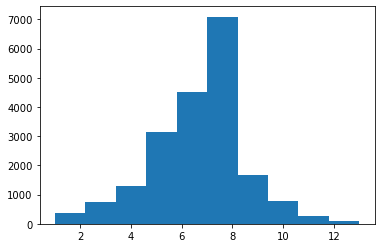

In [10]:
#check number of words in each news headline
plt.hist([len(i.split(' ') ) for i in headline_text])
#plt.hist([len(word_tokenize(i)) for i in headline_text])

In [159]:
#check most frequently appeared words
cnt = Counter()
stop = set(stopwords.words('english'))
x = []
y = []
for word in [t for i in headline_text for t in word_tokenize(i)]:
    if word not in stop:
        cnt[word] += 1
        
most_common = cnt.most_common(40)

for i in most_common:
    x.append(i[0])
    y.append(i[1])
        

/Users/linwang/opt/anaconda3/envs/myenv/lib/python3.8/site-packages/ipykernel/ipkernel.py:287: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


/Users/linwang/opt/anaconda3/envs/myenv/lib/python3.8/site-packages/ipykernel/ipkernel.py:287: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


<AxesSubplot:>

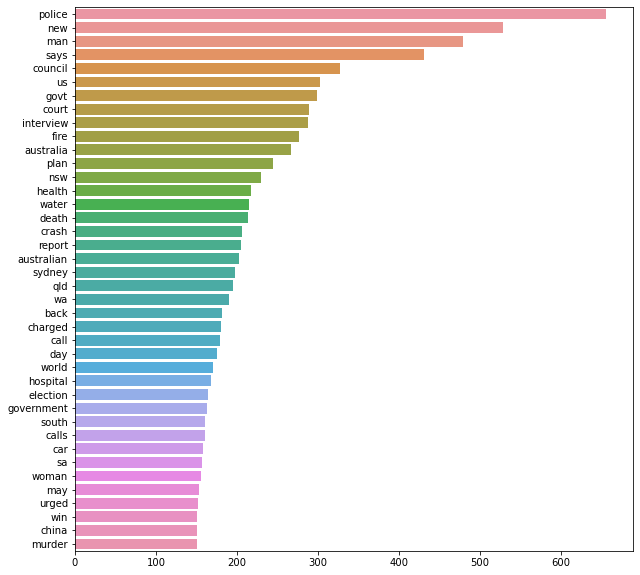

In [171]:
#draw top 40 most frequently appreared words 
plt.figure(figsize = (10,10))
sns.barplot(x = y, y =x)

In [75]:
#count how many words in each news headline
doc_counts = {key: len(doc.split(' ')) for key, doc in enumerate(headline_text)}
doc_counts

/Users/linwang/opt/anaconda3/envs/myenv/lib/python3.8/site-packages/ipykernel/ipkernel.py:287: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


{0: 3,
 1: 4,
 2: 7,
 3: 6,
 4: 7,
 5: 6,
 6: 7,
 7: 7,
 8: 8,
 9: 3,
 10: 6,
 11: 9,
 12: 9,
 13: 9,
 14: 5,
 15: 9,
 16: 9,
 17: 7,
 18: 7,
 19: 8,
 20: 10,
 21: 6,
 22: 4,
 23: 4,
 24: 5,
 25: 6,
 26: 7,
 27: 9,
 28: 7,
 29: 10,
 30: 8,
 31: 9,
 32: 5,
 33: 6,
 34: 6,
 35: 6,
 36: 5,
 37: 6,
 38: 9,
 39: 5,
 40: 8,
 41: 4,
 42: 6,
 43: 9,
 44: 6,
 45: 6,
 46: 6,
 47: 7,
 48: 9,
 49: 3,
 50: 5,
 51: 3,
 52: 8,
 53: 6,
 54: 7,
 55: 7,
 56: 4,
 57: 8,
 58: 7,
 59: 10,
 60: 7,
 61: 7,
 62: 6,
 63: 5,
 64: 6,
 65: 9,
 66: 6,
 67: 6,
 68: 2,
 69: 5,
 70: 5,
 71: 8,
 72: 5,
 73: 5,
 74: 7,
 75: 7,
 76: 7,
 77: 7,
 78: 7,
 79: 10,
 80: 4,
 81: 10,
 82: 7,
 83: 10,
 84: 7,
 85: 9,
 86: 7,
 87: 9,
 88: 9,
 89: 4,
 90: 7,
 91: 6,
 92: 10,
 93: 3,
 94: 8,
 95: 4,
 96: 8,
 97: 5,
 98: 3,
 99: 9,
 100: 9,
 101: 3,
 102: 7,
 103: 6,
 104: 5,
 105: 5,
 106: 5,
 107: 4,
 108: 5,
 109: 4,
 110: 9,
 111: 7,
 112: 4,
 113: 6,
 114: 8,
 115: 4,
 116: 5,
 117: 8,
 118: 7,
 119: 5,
 120: 6,
 121: 7,
 122:

In [173]:

# def stem_words(doc):
#     porter_stemmer=PorterStemmer()
#     stemmed_words=''
#     stem_list =[]
#     for i in doc:
#         for t in i.split():
#             stem_list.append(''.join(porter_stemmer.stem(word=t)))
#     #stem_list.append(stemmed_words)
        
#     return stem_list


#lemmatize the headlines

def lemmztize_word(doc):
    lemmatizer = WordNetLemmatizer()
    stop = set(stopwords.words('english'))
    new_list = []
    for headline in doc:
        words = [i for i in word_tokenize(headline) if (i not in stop)]
        words = [lemmatizer.lemmatize(t) for t in words if len(t) > 2]
        
        new_list.append(words)
    return new_list


headline_stem = lemmztize_word(headline_text)
headline_stem_new=[i for t in headline_stem for i in t]
headline_stem_new

/Users/linwang/opt/anaconda3/envs/myenv/lib/python3.8/site-packages/ipykernel/ipkernel.py:287: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


['interview',
 'daniel',
 'cross',
 'caviar',
 'back',
 'adelaide',
 'north',
 'west',
 'qld',
 'draft',
 'growth',
 'plan',
 'revealed',
 'belinda',
 'neal',
 'available',
 'police',
 'interview',
 'geelong',
 'man',
 'dy',
 'phuket',
 'fall',
 'report',
 'child',
 'welfare',
 'group',
 'attack',
 'interim',
 'commissioner',
 'two',
 'detainee',
 'hospital',
 'slashing',
 'coronavirus',
 'helped',
 'remote',
 'indigenous',
 'community',
 'green',
 'group',
 'fear',
 'reef',
 'inquiry',
 'wont',
 'taken',
 'emission',
 'graph',
 'article',
 'motorcyclist',
 'dy',
 'sun',
 'coast',
 'crash',
 'anglicare',
 'sydney',
 'victim',
 'cyber',
 'security',
 'breach',
 'involving',
 'data',
 'cooperative',
 'member',
 'walk',
 'alice',
 'spring',
 'date',
 'farm',
 'continues',
 'fat',
 'cut',
 'queensland',
 'rural',
 'fire',
 'service',
 'helen',
 'trifelly',
 'first',
 'art',
 'exhibition',
 'new',
 'cancer',
 'drug',
 'signal',
 'government',
 'rethink',
 'evidence',
 'coroner',
 'investiga

In [179]:
# use CountVectorizer to get vocabulary and word frequency
cv = CountVectorizer(stop_words='english')
cv_count = cv.fit_transform(headline_stem_new)
word_counts_dic = cv.vocabulary_
vocab = cv.get_feature_names()

word_counts = np.asarray(cv_count.sum(axis = 0))


/Users/linwang/opt/anaconda3/envs/myenv/lib/python3.8/site-packages/ipykernel/ipkernel.py:287: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [19]:
# dic=gensim.corpora.Dictionary(headline_stem)
# bow_corpus = [dic.doc2bow(doc) for doc in headline_stem]
# token_id_dic = dic.token2id
# len(token_id_dic)

/Users/linwang/opt/anaconda3/envs/myenv/lib/python3.8/site-packages/ipykernel/ipkernel.py:287: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [20]:
#!pip install transformers
import transformers
from transformers import  BertTokenizer, TFBertModel, BertConfig
from tensorflow.data import Dataset
import numpy as np

/Users/linwang/opt/anaconda3/envs/myenv/lib/python3.8/site-packages/ipykernel/ipkernel.py:287: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [21]:
tokenizer = BertTokenizer.from_pretrained('bert-base-uncased')
config = BertConfig.from_pretrained('bert-base-uncased', output_hidden_states = True)
model = TFBertModel.from_pretrained('bert-base-uncased', config = config)

/Users/linwang/opt/anaconda3/envs/myenv/lib/python3.8/site-packages/ipykernel/ipkernel.py:287: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)
Some layers from the model checkpoint at bert-base-uncased were not used when initializing TFBertModel: ['nsp___cls', 'mlm___cls']
- This IS expected if you are initializing TFBertModel from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing TFBertModel from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassification model from a BertForSequenceClassification model).
All the layers of TFBertModel

In [31]:
#tokenize using Bert tokenizer
def preprocess(text):
    return tokenizer(text, return_tensors= 'tf',truncation = True, padding=True)
special_tokens = tokenizer.special_tokens_map
special_tokens

/Users/linwang/opt/anaconda3/envs/myenv/lib/python3.8/site-packages/ipykernel/ipkernel.py:287: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [35]:
token_sen = preprocess(headline_text)
token_word = preprocess(vocab)

/Users/linwang/opt/anaconda3/envs/myenv/lib/python3.8/site-packages/ipykernel/ipkernel.py:287: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [37]:
#using Bert model to get doc embedding and word embedding
word_emb = model(**token_word)
doc_emb = model(**token_sen)

/Users/linwang/opt/anaconda3/envs/myenv/lib/python3.8/site-packages/ipykernel/ipkernel.py:287: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [40]:
#np.save('word_emb.last_hidden_state_new.npy',np.array(word_emb.last_hidden_state))
#np.save('./Project2_topic_modeling/doc_emb.last_hidden_state.npy',np.array(doc_emb.last_hidden_state))
#np.save('./Project2_topic_modeling/doc_emb.pooler_output.npy',np.array(doc_emb.pooler_output))
#np.save('./Project2_topic_modeling/doc_emb_full.npy',np.array(doc_emb))

/Users/linwang/opt/anaconda3/envs/myenv/lib/python3.8/site-packages/ipykernel/ipkernel.py:287: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [41]:
doc_emb_last_hidden_state= np.load('/Users/linwang/Intern_stuff/intern_work_summary/Project2_topic_modeling/doc_emb.last_hidden_state.npy',allow_pickle=True)
word_emb_last_hidden = np.load('/Users/linwang/Intern_stuff/intern_work_summary/Project2_topic_modeling/word_emb.last_hidden_state_new.npy')


/Users/linwang/opt/anaconda3/envs/myenv/lib/python3.8/site-packages/ipykernel/ipkernel.py:287: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [183]:
# dataset_word = Dataset.from_tensor_slices((token_word['input_ids'], token_word['token_type_ids'], token_word['attention_mask']))
# dataset_word = dataset_word.batch(32)


/Users/linwang/opt/anaconda3/envs/myenv/lib/python3.8/site-packages/ipykernel/ipkernel.py:287: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [184]:
#take average of dimension 2 (i.e. 8)
word_emb = np.mean(word_emb_last_hidden, axis=1)
doc_emb = np.mean(doc_emb_last_hidden_state, axis = 1)

/Users/linwang/opt/anaconda3/envs/myenv/lib/python3.8/site-packages/ipykernel/ipkernel.py:287: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [ ]:
# umap_embeddings = umap.UMAP(n_neighbors=5, 
#                             n_components=32,
#                             min_dist=0.1,
#                             metric='cosine',
#                             random_state=42).fit_transform(doc_emb)

# cluster = hdbscan.HDBSCAN(min_cluster_size=15,
#                           metric='euclidean',                      
#                           cluster_selection_method='eom').fit(umap_embeddings)




# umap_embeddings = umap.UMAP(n_neighbors=8, 
#                             n_components=64,
#                             min_dist=0.1,
#                             metric='cosine',
#                             random_state=42).fit_transform(doc_emb)

# cluster = hdbscan.HDBSCAN(min_cluster_size=10,
#                           metric='euclidean',                      
#                           cluster_selection_method='eom').fit(umap_embeddings)



In [46]:
import bertopic
from bertopic import BERTopic

/Users/linwang/opt/anaconda3/envs/myenv/lib/python3.8/site-packages/ipykernel/ipkernel.py:287: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)
/Users/linwang/opt/anaconda3/envs/myenv/lib/python3.8/site-packages/plotly/graph_objs/__init__.py:287: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(ipywidgets.__version__) >= LooseVersion("7.0.0"):
/Users/linwang/opt/anaconda3/envs/myenv/lib/python3.8/site-packages/plotly/graph_objs/__init__.py:287: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(ipywidgets.__version__) >= LooseVersion("7.0.0"):
/Users/linwang/opt/anaconda3/envs/myenv/lib/python3.8/site-packages/plotly/graph_objs/__i

In [47]:
#use umap to reduce embedding dimension and hdbscan to create clusters

umap_model = umap.UMAP(n_neighbors=18,
                       n_components=64,
         
                       min_dist=0.1,
                       metric='cosine',
                       low_memory=False,
                       random_state=42)

# Define HDBSCAN model to perform documents clustering
hdbscan_model = hdbscan.HDBSCAN(min_cluster_size=20,
                                #min_samples=1,
                                metric='euclidean',
                                cluster_selection_method='eom',
                                prediction_data=True,
                               )



/Users/linwang/opt/anaconda3/envs/myenv/lib/python3.8/site-packages/ipykernel/ipkernel.py:287: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [48]:
# Create BERTopic model to do topic analysis 
topic_model_bert = BERTopic(top_n_words=30,
                       n_gram_range=(1,1), 
                       calculate_probabilities=True,
                       umap_model= umap_model,
                       hdbscan_model=hdbscan_model,
                       #similarity_threshold_merging=0.5,
                       verbose=True)

# Train model, extract topics and probabilities
topics, probabilities = topic_model_bert.fit_transform(headline_text)


/Users/linwang/opt/anaconda3/envs/myenv/lib/python3.8/site-packages/ipykernel/ipkernel.py:287: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


Batches:   0%|          | 0/625 [00:00<?, ?it/s]

2022-02-14 00:24:04,652 - BERTopic - Transformed documents to Embeddings
2022-02-14 00:25:22,067 - BERTopic - Reduced dimensionality with UMAP
/Users/linwang/opt/anaconda3/envs/myenv/lib/python3.8/site-packages/hdbscan/hdbscan_.py:56: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  condensed_tree = condense_tree(single_linkage_tree,
/Users/linwang/opt/anaconda3/envs/myenv/lib/python3.8/site-packages/hdbscan/hdbscan_.py:59: DeprecationWarning: `np.bool` is a deprecated alias for the builtin `bool`. To silence this warning, use `bool` by itself. Doin

In [ ]:
#np.unique(cluster.labels_)

In [49]:
#check number of topics derived
np.unique(topics)

/Users/linwang/opt/anaconda3/envs/myenv/lib/python3.8/site-packages/ipykernel/ipkernel.py:287: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


array([ -1,   0,   1,   2,   3,   4,   5,   6,   7,   8,   9,  10,  11,
        12,  13,  14,  15,  16,  17,  18,  19,  20,  21,  22,  23,  24,
        25,  26,  27,  28,  29,  30,  31,  32,  33,  34,  35,  36,  37,
        38,  39,  40,  41,  42,  43,  44,  45,  46,  47,  48,  49,  50,
        51,  52,  53,  54,  55,  56,  57,  58,  59,  60,  61,  62,  63,
        64,  65,  66,  67,  68,  69,  70,  71,  72,  73,  74,  75,  76,
        77,  78,  79,  80,  81,  82,  83,  84,  85,  86,  87,  88,  89,
        90,  91,  92,  93,  94,  95,  96,  97,  98,  99, 100, 101, 102,
       103, 104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115,
       116, 117])

In [50]:
#labels_ = list(enumerate(cluster.labels_))
#assign each document(i.e. news headline) it's topic number
labels_ = list(enumerate(topics))

/Users/linwang/opt/anaconda3/envs/myenv/lib/python3.8/site-packages/ipykernel/ipkernel.py:287: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [187]:
#create dic with keys indicate topic number, and values indicate list of doc belongs to the topic 
topic_group = {topic[0]: [idx[0] for idx in topic[1]] for topic in itertools.groupby(sorted(labels_, key = lambda x :x[1]), key = lambda x: x[1])}
topic_group


/Users/linwang/opt/anaconda3/envs/myenv/lib/python3.8/site-packages/ipykernel/ipkernel.py:287: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


{-1: [1,
  2,
  6,
  8,
  11,
  15,
  16,
  17,
  19,
  21,
  26,
  27,
  28,
  31,
  32,
  33,
  37,
  40,
  43,
  44,
  48,
  50,
  53,
  54,
  55,
  56,
  57,
  58,
  63,
  64,
  67,
  69,
  70,
  72,
  73,
  75,
  77,
  79,
  85,
  90,
  91,
  93,
  94,
  97,
  98,
  100,
  101,
  102,
  106,
  108,
  110,
  111,
  112,
  113,
  114,
  116,
  118,
  120,
  124,
  125,
  126,
  129,
  132,
  133,
  135,
  137,
  138,
  139,
  142,
  143,
  145,
  148,
  149,
  151,
  153,
  154,
  155,
  157,
  159,
  160,
  161,
  162,
  167,
  169,
  170,
  172,
  175,
  178,
  181,
  183,
  185,
  186,
  187,
  190,
  191,
  192,
  193,
  194,
  195,
  199,
  200,
  201,
  203,
  204,
  206,
  208,
  210,
  211,
  212,
  213,
  215,
  217,
  221,
  222,
  223,
  224,
  228,
  229,
  230,
  232,
  235,
  236,
  237,
  239,
  240,
  242,
  243,
  244,
  245,
  247,
  248,
  249,
  250,
  256,
  257,
  258,
  259,
  262,
  263,
  264,
  265,
  266,
  267,
  268,
  269,
  270,
  274,
  276,
  277,
  

In [52]:
#get rid of topic -1 which are all the documents that don't belong to any of the topics 
del topic_group[-1]

/Users/linwang/opt/anaconda3/envs/myenv/lib/python3.8/site-packages/ipykernel/ipkernel.py:287: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [54]:
#group doc_emb based on the topic and the doc_index 
doc_emb_group = {i : np.take(doc_emb, topic_group[i], axis = 0) for i in topic_group.keys()}

#take average of the doc_emb in each topic group 
doc_emb_mean = {i: np.mean(doc_emb_group[i], axis = 0) for i in topic_group.keys()}

/Users/linwang/opt/anaconda3/envs/myenv/lib/python3.8/site-packages/ipykernel/ipkernel.py:287: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [56]:
#create topic embedding 
topic_emb_list = []
for i in doc_emb_mean:
    topic_emb_list.append(doc_emb_mean[i].tolist())
    topic_emb = np.array(topic_emb_list)

/Users/linwang/opt/anaconda3/envs/myenv/lib/python3.8/site-packages/ipykernel/ipkernel.py:287: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [57]:
from sklearn import preprocessing

#normalzied centroid topic vectors
def normalization(vector):
    return preprocessing.normalize(vector, norm='l2',axis=1, copy=True, return_norm=False)



topic_vec_norm = normalization(topic_emb)
word_vec_norm = normalization(word_emb)
doc_vec_norm = normalization(doc_emb)

/Users/linwang/opt/anaconda3/envs/myenv/lib/python3.8/site-packages/ipykernel/ipkernel.py:287: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [58]:
#get doc-topic-distribution, which is the matrix of document-topic probabilities

topic_term_dis = cosine_similarity(topic_vec_norm,word_vec_norm)
doc_topic_dis = cosine_similarity(doc_vec_norm,topic_vec_norm)


/Users/linwang/opt/anaconda3/envs/myenv/lib/python3.8/site-packages/ipykernel/ipkernel.py:287: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [71]:
#prepare data needed for pyLDAvis visualization 
pyldavis_data = pyLDAvis.prepare(topic_term_dis, 
                 doc_topic_dis, 
                 doc_counts, vocab, 
                 word_counts.flatten(), R=30, lambda_step=0.01, mds=pyLDAvis.js_PCoA, n_jobs=-1, plot_opts={'xlab': 'PC1', 'ylab': 'PC2'}, sort_topics=True)


/Users/linwang/opt/anaconda3/envs/myenv/lib/python3.8/site-packages/ipykernel/ipkernel.py:287: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [212]:
#visualizes the results
pyLDAvis.display(pyldavis_data)

/Users/linwang/opt/anaconda3/envs/myenv/lib/python3.8/site-packages/ipykernel/ipkernel.py:287: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [213]:
#save the graph to html file
pyLDAvis.save_html(pyldavis_data, './lda.html')

/Users/linwang/opt/anaconda3/envs/myenv/lib/python3.8/site-packages/ipykernel/ipkernel.py:287: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [210]:
# from html2image import Html2Image
# hti = Html2Image()
# hti.screenshot(
#     html_file='./lda_graph.html',
#     save_as='lda_graph.png'
# )

/Users/linwang/opt/anaconda3/envs/myenv/lib/python3.8/site-packages/ipykernel/ipkernel.py:287: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


['/Users/linwang/Intern_stuff/intern_work_summary/Project2_topic_modeling/lda_graph.png']